In [55]:
import io
import pandas as pd
from IPython.display import Image
from PIL import Image as PILImage, ImageDraw, ImageFont

# Detecting faces and emotions using Vision

This notebooks shows how you can use the Google Cloud Vision API to easily detect faces and related emotions.

We'll use the Google Cloud Client Library for Vision to perform face detection on lovely picture from PyCascades.

In [ ]:
from google.cloud import vision

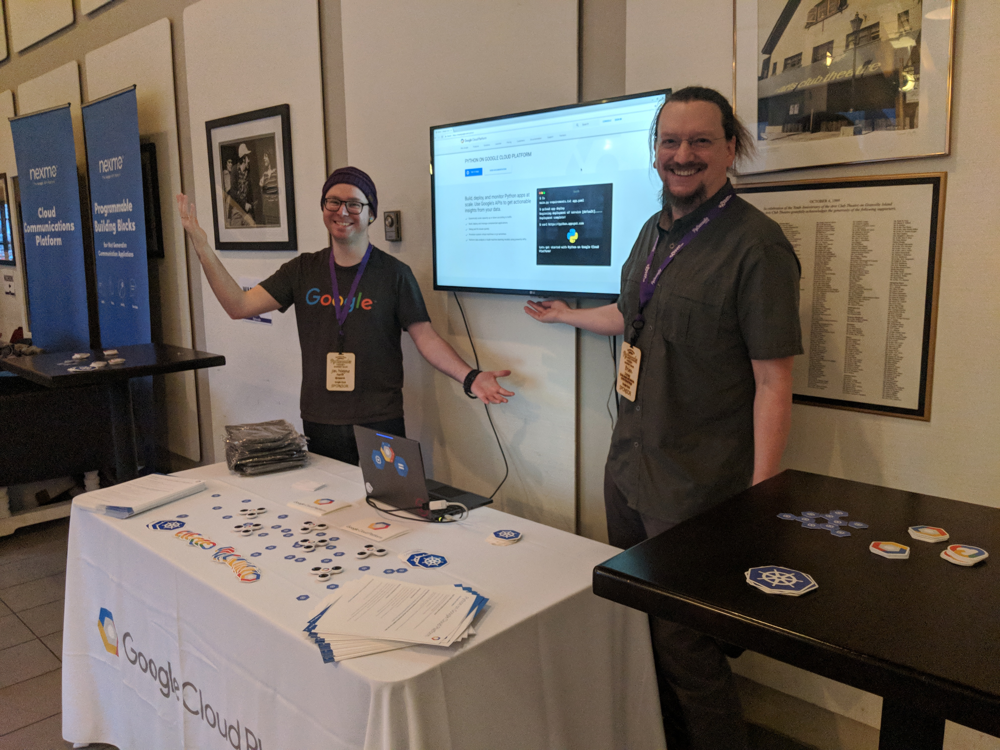

In [62]:
picture_with_faces = open('data/jon_and_brian.jpg', 'rb').read()

# Display our lovely picture
Image(picture_with_faces, width=1024)

## Use the Vision library to run the detection

This creates a client and runs the detection on our image. It outputs the raw data from the API.

In [57]:
client = vision.ImageAnnotatorClient()

In [58]:
response = client.face_detection(image=vision.types.Image(content=picture_with_faces))
response

face_annotations {
  bounding_poly {
    vertices {
      x: 2581
      y: 356
    }
    vertices {
      x: 2976
      y: 356
    }
    vertices {
      x: 2976
      y: 816
    }
    vertices {
      x: 2581
      y: 816
    }
  }
  fd_bounding_poly {
    vertices {
      x: 2616
      y: 467
    }
    vertices {
      x: 2934
      y: 467
    }
    vertices {
      x: 2934
      y: 786
    }
    vertices {
      x: 2616
      y: 786
    }
  }
  landmarks {
    type: LEFT_EYE
    position {
      x: 2705.24658203125
      y: 570.1004638671875
      z: 0.002085610292851925
    }
  }
  landmarks {
    type: RIGHT_EYE
    position {
      x: 2831.714111328125
      y: 568.3045043945312
      z: -16.386293411254883
    }
  }
  landmarks {
    type: LEFT_OF_LEFT_EYEBROW
    position {
      x: 2669.283935546875
      y: 538.689697265625
      z: 14.301423072814941
    }
  }
  landmarks {
    type: RIGHT_OF_LEFT_EYEBROW
    position {
      x: 2734.502685546875
      y: 542.79296875
      

## Visualizing this data

Okay, that's a lot of data. Let's use the magic of jupyter to visualize it.

### Where are the faces?

Let's draw bounding boxes around all the detected faces.

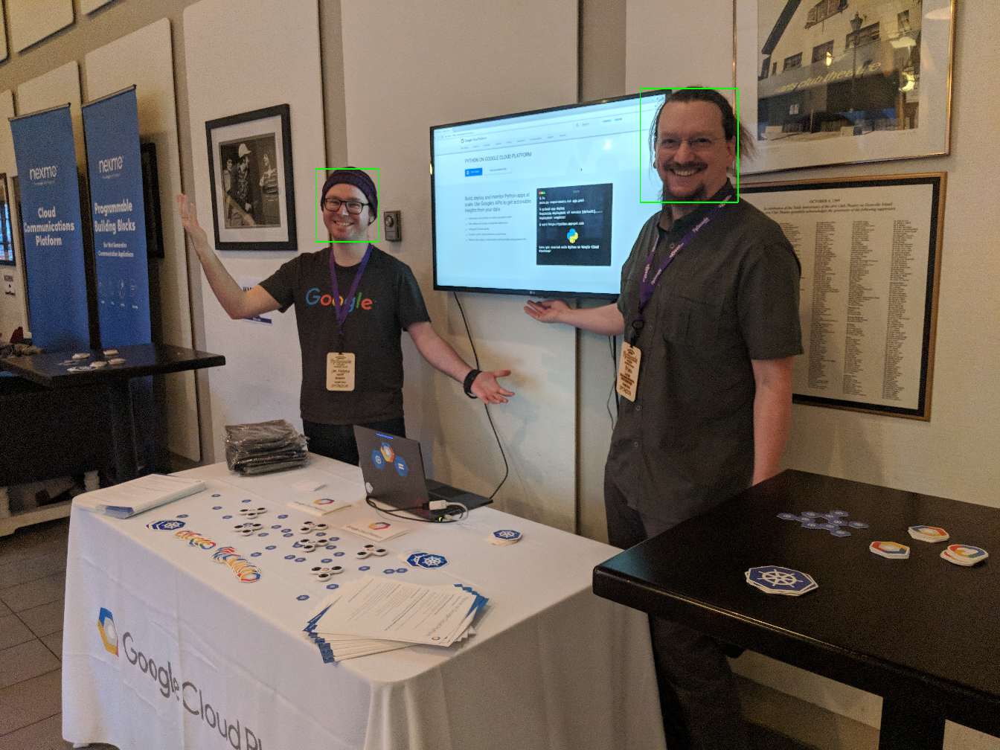

In [59]:
img = PILImage.open(io.BytesIO(picture_with_faces))
draw = ImageDraw.Draw(img)

for face in response.face_annotations:
    box = [(vertex.x, vertex.y)
           for vertex in face.bounding_poly.vertices]
    draw.line(box + [box[0]], width=5, fill='#00ff00')

img = img.resize((int(img.width/3), int(img.height/3)))

img

### How about facial features?

The Vision API gives us extensive information about facial landmarks

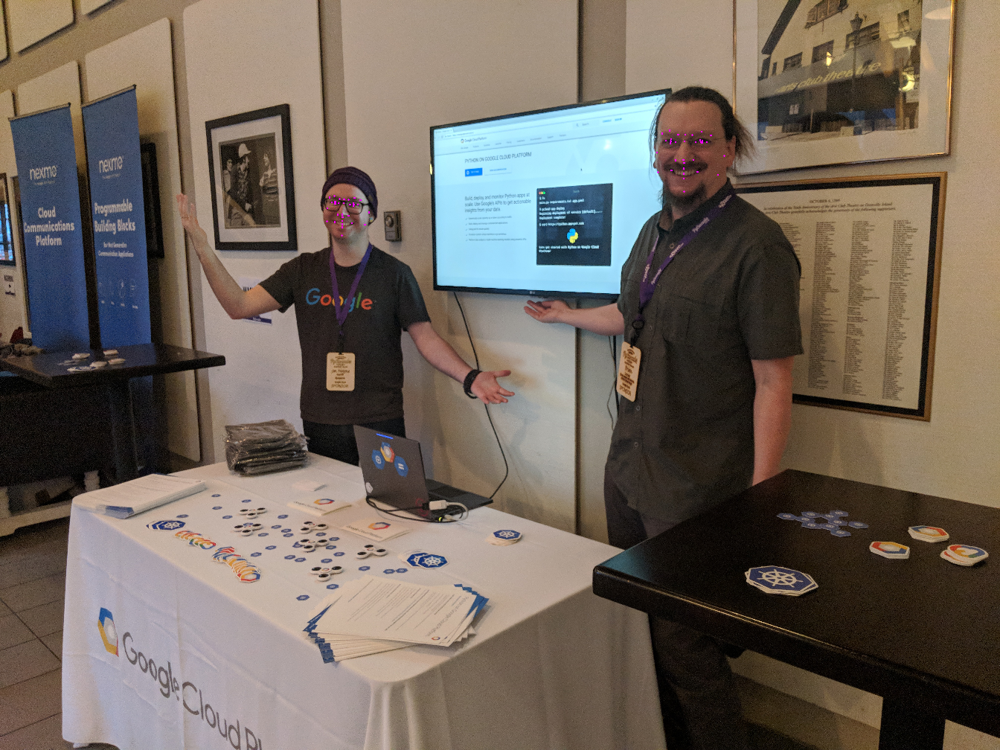

In [60]:
img = PILImage.open(io.BytesIO(picture_with_faces))
draw = ImageDraw.Draw(img)

for face in response.face_annotations:
    for landmark in face.landmarks:
        origin = (landmark.position.x, landmark.position.y)
        size = 3
        draw.ellipse(((origin[0]-size, origin[1]-size), (origin[0]+size, origin[1]+size)), fill='#FF00FF10')

img = img.resize((int(img.width/3), int(img.height/3)))

img

### How about emotions?

The Vision API also provides the likelihood of joy, sorry, anger, and surprising.

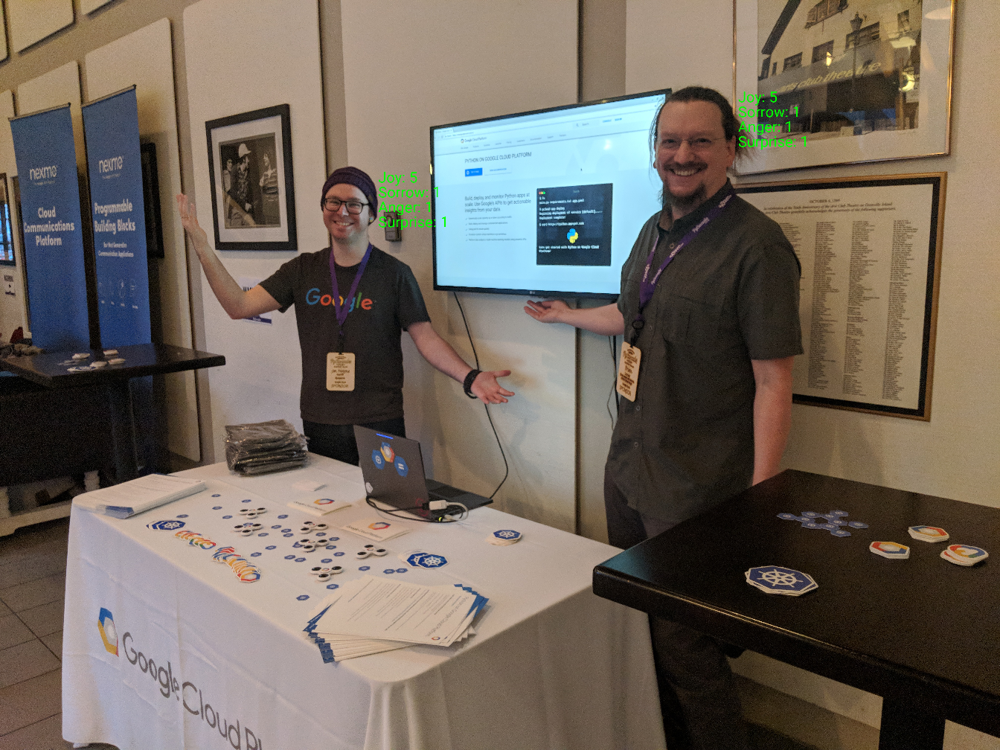

In [61]:
img = PILImage.open(io.BytesIO(picture_with_faces))
draw = ImageDraw.Draw(img)
font = ImageFont.truetype('data/roboto.ttf', 60)

for face in response.face_annotations:
    pos = (face.bounding_poly.vertices[1].x, face.bounding_poly.vertices[1].y)
    text = (
        f'Joy: {face.joy_likelihood}\n'
        f'Sorrow: {face.sorrow_likelihood}\n'
        f'Anger: {face.anger_likelihood}\n'
        f'Surprise: {face.surprise_likelihood}\n'
    )
    draw.multiline_text(pos, text, font=font, fill='#00FF00')

img = img.resize((int(img.width/3), int(img.height/3)))

img